# Further Processing Gene Expression Files
### Laurence Nickel (i6257119)

Libraries used: 
* pandas (version: '1.2.4')
* numpy (version: '1.20.1')
* matplotlib.pyplot (version: '3.3.4')
* seaborn (version: '0.11.1')
* plotly.express (version: '5.13.1')
* math (version: '3.8.8')
* sys (version: '3.8.8') 
* os (version: '3.8.8')
* random (version: '3.8.8')
* sklearn.impute (version: '0.24.1')
* sklearn.metrics (version: '0.24.1')
* sklearn.decomposition (version: '0.24.1')

References: 

* [1] Novogene (2023). How to choose Normalization methods (TPM/RPKM/FPKM) for mRNA expression. Available: https://www.novogene.com/us-en/resources/blog/how-to-choose-normalization-methods-tpm-rpkm-fpkm-for-mrna-expression/ (last accessed May 8, 2023).
* [2] Zhao, Y., Wong, L., & Goh, W. W. B. (2020). How to do quantile normalization correctly for gene expression data analyses. *Scientific Reports, 10*(1): 15534. doi: https://doi.org/10.1038/s41598-020-72664-6.

## Introduction

Within this notebook, the gene expression files downloaded within the notebook 'Loading Data.ipynb' will be further processed. This includes combining the files into a single file where every column represents a sample as well as performing some basic exploratory data analysis, handling potential missing values, detecting potential outliers, and applying log2-transformation resulting in the cleaned gene expression data.

As mentioned in the notebook 'Loading Data.ipynb', the files are stored to a directory created by TCGA Biolinks as I am not able to define the destination directory for the files. Therefore, in between of running the 'Loading Data.ipynb' and this notebook, the data has been manually moved to the 'Bachelor Thesis Data/original_data/gene_expression_files' folder. 

### The Data

To present a clear view of the gene expression data that we have collected up until this point, the following overview is provided.

__Gene Expression Data__:
* In total, 65 files were retrieved each containing the gene expression values for a single sample (certain patient at a certain time, as a single patient could have multiple samples present within our complete dataset). Within each of these files, gene expression values are given for 60,660 genes which are each represented by a single row. These genes are identified by both the first and second column which respectively contain the gene id and gene name.
* Gene expression values actually represent the amount of activity or expression of each gene for the current sample. This value is measured in Transcripts Per Million (TPM) units. TPM is a normalization method of the amount of RNA transcripts for a particular gene in a sample [1]. To calculate TPM values, the raw read count of each gene is first determined by the sequencing method. These numbers represent the number of RNA fragments or reads associated with a particular gene. Then, calculations are adjusted for various factors such as gene length and sequence depth to obtain different TPM values. TPM values are expressed on a logarithmic scale, representing the expression of a gene between samples. Higher TPM values indicate higher expression levels, while lower values indicate lower expression levels. TPM normalization allows gene expression levels to be compared between samples, and changes in sequence depth and gene length are accounted for [1].
* Using TPM values, we can measure and analyze gene expression in the 65 samples in our data set, providing valuable insights into possible molecular functions and relationships and of various biological phenomena, diseases, or treatments.

### Importing libraries

Before we can start to further process the data present in the gene expression files, we should first import some libraries that will be used throughout this notebook.

In [1]:
print("Starting the importing of the libraries...")


import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

# Here we first need to install the plotly library.
!pip install plotly
import plotly
import plotly.express as px

import math
import sys
import random
import os

import sklearn
from sklearn.impute import KNNImputer
from sklearn.metrics import mean_squared_error
from sklearn.decomposition import PCA


print("Finishing the installing of the libraries.")

Starting the importing of the libraries...
Finishing the installing of the libraries.


Now that all the libraries have been imported, we can verify that these libraries have been loaded into this notebook by calling the version property of the library.

In [2]:
# Retrieving the version of the libraries to verify they have been correctly loaded into this notebook.
print("The library 'pd' (pandas) has been loaded into the notebook with its version being:")
print(pd.__version__)

print("\nThe library 'np' (numpy) has been loaded into the notebook with its version being:")
print(np.__version__)

print("\nThe library 'matplotlib' has been loaded into the notebook with its version being:")
print(matplotlib.__version__)

print("\nThe library 'sns' (seaborn) has been loaded into the notebook with its version being:")
print(sns.__version__)

print("\nThe library 'plotly' has been loaded into the notebook with its version being:")
print(plotly.__version__)

print("\nThe library 'sys' has been loaded into the notebook with its version being:")
print(sys.version)

print("\nThe library 'sklearn' has been loaded into the notebook with its version being:")
print(sklearn.__version__)

The library 'pd' (pandas) has been loaded into the notebook with its version being:
1.2.4

The library 'np' (numpy) has been loaded into the notebook with its version being:
1.20.1

The library 'matplotlib' has been loaded into the notebook with its version being:
3.3.4

The library 'sns' (seaborn) has been loaded into the notebook with its version being:
0.11.1

The library 'plotly' has been loaded into the notebook with its version being:
5.13.1

The library 'sys' has been loaded into the notebook with its version being:
3.8.8 (default, Apr 13 2021, 15:08:03) [MSC v.1916 64 bit (AMD64)]

The library 'sklearn' has been loaded into the notebook with its version being:
0.24.1


### Defining the data directories

In addition, we also need to define our data directories from which the files will be loaded and to which the resulting files will be stored. Please mind that these need to be changed to the desired directories to be able to work with the data directories.

In [3]:
data_directory_original_files = "C:/Users/laure/OneDrive/Documenten/Bachelor Thesis Data/original_data"
data_directory_combined_not_cleaned_files = "C:/Users/laure/OneDrive/Documenten/Bachelor Thesis Data/combined_not_cleaned_data"
data_directory_combined_cleaned_files = "C:/Users/laure/OneDrive/Documenten/Bachelor Thesis Data/combined_cleaned_data"

## Loading Reference Table File

Next, we can load the csv file called 'reference_table_files_per_patient.csv' which contains all of the different case ids together with which gene expression file (and methylation files) belongs to it allowing us to name the columns of the resulting combined gene expression file (which will contain the data of all the gene expression files) such that the origin of the columns is easily understandable. To load the csv file, we can call the function 'pd.read_csv()'.

In [4]:
reference_table_files = pd.read_csv(data_directory_original_files + "/" + "reference_table_files_per_patient.csv")
print("The reference table for which files belong to which case_id:")
reference_table_files

The reference table for which files belong to which case_id:


,case_id,methylation_file_green_channel,methylation_file_red_channel,gene_expression_file
0,TCGA-06-0125-01A-01,964f8f23-7801-412f-981d-5ee34ffc6dd1_noid_Grn....,964f8f23-7801-412f-981d-5ee34ffc6dd1_noid_Red....,e1757a20-2d6f-4aee-bafb-804302b448ea.rna_seq.a...
1,TCGA-06-0125-02A-11,70d41610-9d05-4101-84c0-ed3280f1656c_noid_Grn....,70d41610-9d05-4101-84c0-ed3280f1656c_noid_Red....,a01b2990-48f1-4513-8438-df7d1c39b51f.rna_seq.a...
2,TCGA-06-0152-02A-01,416ac016-2058-4ffb-9adc-5cee517670f8_noid_Grn....,416ac016-2058-4ffb-9adc-5cee517670f8_noid_Red....,f5e230a7-b044-4190-8b61-36260d8cd54c.rna_seq.a...
3,TCGA-06-0171-02A-11,e410fe15-33c0-4381-aebe-0b5a4d8c5b68_noid_Grn....,e410fe15-33c0-4381-aebe-0b5a4d8c5b68_noid_Red....,52f507d3-113b-4995-9b7a-8677e7812ef3.rna_seq.a...
4,TCGA-06-0190-01A-01,e1f76540-4db5-4efb-aabb-00073f0dbb82_noid_Grn....,e1f76540-4db5-4efb-aabb-00073f0dbb82_noid_Red....,dad61e18-e3f1-4beb-b3c3-ae434e35af2d.rna_seq.a...
...,...,...,...,...
60,TCGA-76-4927-01A-01,d267e2c1-c9ae-4778-9716-d93d58fad44a_noid_Grn....,d267e2c1-c9ae-4778-9716-d93d58fad44a_noid_Red....,54c6eff1-866a-4b26-9778-6b085fc25123.rna_seq.a...
61,TCGA-76-4928-01B-01,7247c175-1680-4a80-8c4a-792a0f52960c_noid_Grn....,7247c175-1680-4a80-8c4a-792a0f52960c_noid_Red....,1069403e-ef6a-43d4-b62d-3249e5a8e034.rna_seq.a...
62,TCGA-76-4929-01A-01,ff1b4f0b-5a24-47dd-886a-45e84f98b149_noid_Grn....,ff1b4f0b-5a24-47dd-886a-45e84f98b149_noid_Red....,ff86d680-8a35-4f19-a850-eca08dfd3d48.rna_seq.a...
63,TCGA-76-4931-01A-01,fb5580c7-e673-42ed-ab47-ad7d532cc3e3_noid_Grn....,fb5580c7-e673-42ed-ab47-ad7d532cc3e3_noid_Red....,5b56daff-2531-46b1-a277-86b88b878c61.rna_seq.a...


## Further Processing Gene Expression Files

### Combining the gene expression files

Before we can combine the gene expression files, we first need to download them from the data directory to be able to work with them. Since the gene expression files are stored in the folder 'gene_expression_files' within the 'data_directory_original_files', we need to define this directory first.

In [5]:
gene_expression_files_directory = data_directory_original_files + "/gene_expression_files"

Now that the directory of the gene expression files has been defined, we can first retrieve the file names of the gene expression files in the 'gene_expression_files_directory'.

In [6]:
# Retrieving the file names of the (and the number of) gene expression files in the 'gene_expression_files_directory'.
gene_expression_file_names = os.listdir(gene_expression_files_directory)
number_of_gene_expression_files = len(gene_expression_file_names)
print("There are " + str(number_of_gene_expression_files) + " gene expression files in the 'gene_expression_files_directory' with the names:")
for file_name in gene_expression_file_names:
    print(file_name)

There are 66 gene expression files in the 'gene_expression_files_directory' with the names:
08dce278-ba8d-4ba0-90a1-e40820fd1740.rna_seq.augmented_star_gene_counts.tsv
1069403e-ef6a-43d4-b62d-3249e5a8e034.rna_seq.augmented_star_gene_counts.tsv
139fe07b-05fb-4bc5-b6e2-179269e7ca51.rna_seq.augmented_star_gene_counts.tsv
13da7123-db39-4bab-9521-daef5d3030ae.rna_seq.augmented_star_gene_counts.tsv
1483c347-bb2c-4678-af16-163e4fc1791d.rna_seq.augmented_star_gene_counts.tsv
1a61593f-909e-46f4-8cfa-9e23bc050033.rna_seq.augmented_star_gene_counts.tsv
1f027bee-5316-4d9f-a566-41890da18493.rna_seq.augmented_star_gene_counts.tsv
251de1f4-0bc3-4b44-af08-1abc9c720f67.rna_seq.augmented_star_gene_counts.tsv
2c25aa49-879a-4023-80b4-84df717dc537.rna_seq.augmented_star_gene_counts.tsv
32291119-ef4e-4041-9949-dc88dfce459a.rna_seq.augmented_star_gene_counts.tsv
325f91c9-70b9-4285-a7ff-0b7b6280a8ed.rna_seq.augmented_star_gene_counts.tsv
37bae717-22b7-4a28-8768-ab83c62ad8ee.rna_seq.augmented_star_gene_counts.

As we can see from the output above, there are 66 files in the 'gene_expression_files_directory' which contradicts with the number of gene expression files we have downloaded in the 'Loading Data.ipnyb' notebook. As already explained towards the end of the 'Loading Data.ipynb' notebook, an extra file is retrieved from the directory when calling a function such as 'os.listdir()' which is a hidden configuration file. This file is found in every folder on Microsoft Windows and is called 'desktop.ini'. Since we do not need to add this file to our 'gene_expression_data' DataFrame, we can remove it from the list 'gene_expression_file_names'.

In [7]:
# Removing the 'Desktop.ini' file name from the 'gene_expression_file_names'.
for file_name in gene_expression_file_names:
    if file_name == "desktop.ini":
        gene_expression_file_names.remove(file_name)

# Retrieving the number of gene expression files in the 'gene_expression_files_directory' after removing the 'desktop.ini' 
# file. 
number_of_gene_expression_files = len(gene_expression_file_names)
print("There are " + str(number_of_gene_expression_files) + " gene expression files in the 'gene_expression_files_directory' with the names:")
for file_name in gene_expression_file_names:
    print(file_name)

There are 65 gene expression files in the 'gene_expression_files_directory' with the names:
08dce278-ba8d-4ba0-90a1-e40820fd1740.rna_seq.augmented_star_gene_counts.tsv
1069403e-ef6a-43d4-b62d-3249e5a8e034.rna_seq.augmented_star_gene_counts.tsv
139fe07b-05fb-4bc5-b6e2-179269e7ca51.rna_seq.augmented_star_gene_counts.tsv
13da7123-db39-4bab-9521-daef5d3030ae.rna_seq.augmented_star_gene_counts.tsv
1483c347-bb2c-4678-af16-163e4fc1791d.rna_seq.augmented_star_gene_counts.tsv
1a61593f-909e-46f4-8cfa-9e23bc050033.rna_seq.augmented_star_gene_counts.tsv
1f027bee-5316-4d9f-a566-41890da18493.rna_seq.augmented_star_gene_counts.tsv
251de1f4-0bc3-4b44-af08-1abc9c720f67.rna_seq.augmented_star_gene_counts.tsv
2c25aa49-879a-4023-80b4-84df717dc537.rna_seq.augmented_star_gene_counts.tsv
32291119-ef4e-4041-9949-dc88dfce459a.rna_seq.augmented_star_gene_counts.tsv
325f91c9-70b9-4285-a7ff-0b7b6280a8ed.rna_seq.augmented_star_gene_counts.tsv
37bae717-22b7-4a28-8768-ab83c62ad8ee.rna_seq.augmented_star_gene_counts.

As we can see, the 'desktop.ini' file has been removed meaning we can move on to the next step which is to loop over all the file names and retrieve the file belonging to it (which is no issue as the file names are unique). When such a file has been loaded from the 'gene_expression_files_directory', the column of gene expression data can be added to the 'gene_expression_data' DataFrame. To open a tsv file, which is the format of the gene expression data, the function 'pd.read_csv()' can be called. In addition to the file to be read as a parameter, the 'delimiter' parameter is also added which specifies how the data should be split into columns which is here set to '\t'. This means that the data within the tsv file is separated into different columns by a '\t' (tab) character.

Unlike a file with methylation data, the files with gene expression data have multiple columns with expression data (TPM, FPKM, FPKM_uq). I have decided, however, to include only one of these columns as I am aiming to investigate how machine learning techniques be used to identify key sites of DNA methylation that affect gene expression in brain cancer and I am not aiming to compare the different gene expression values with each other. Here, I have chosen to include the 'TPM' (Transcript Per Million) column in my final gene expression DataFrame for every case (to stay consistent, we will always use this column) which is motivated by the following:
* TPM takes into account transcript length and sequencing depth to normalize gene expression levels, which may be useful when considering the gene expression data from different cases [1]. When RNA sequencing data is generated, the expression level of the gene together with the length of the gene and the sequencing depth influences the number of reads mapping to each of the genes. TPM takes this into account by normalizing the read counts by the total number of reads and the length of the current gene, which is quite important when studying the relationship between methylation and gene expression levels as the differences in transcipt length and sequencing depth can cause unexpected relationships between the two. In addition, the normalization also allows us to compare expression levels between genes and cases.

Before the data is actually added, we want to make sure that all of the genes present in one file are also present in any other file. Therefore, after having added the first gene expression file to the 'gene_expression_data' DataFrame which will also be used for adding the ids of the genes as the very first column and the names of the genes as the second column, the other gene expression data will be checked such that the exact same (no more, no less, in the same order) genes are present in the to be added gene expression content as in the 'gene_expression_data' DataFrame and that the gene expression (TPM) values are assigned to the correct genes in the 'gene_expression_data' DataFrame.

Since loading the tsv files containing the gene expression data into DataFrames causes the first line '# gene-model: GENCODE v36' to be seen as the only column, indexing is quite difficult. Therefore, we first loop over all of the different files and make sure to delete the first line, such that the next line consists of the columns that represents the different features such as the 'gene_id' and 'gene_name'.

In [8]:
# Looping over every gene expression data file downloaded and deleting the line '# gene-model: GENCODE v36'.
for file_name in gene_expression_file_names:
    file_to_open = gene_expression_files_directory + "/" + file_name
    
    # We first open the file to retrieve all the files and then rewrite the files where every line is included except for 
    # the '# gene-model: GENCODE v36' line
    with open(file_to_open, "r") as input_file:
        lines = input_file.readlines()
    with open(file_to_open, "w") as output_file:
        for line in lines:
            if line.strip("\n") != "# gene-model: GENCODE v36":
                output_file.write(line)

We can then check whether this line has indeed been removed for every file by checking for each of the gene expression data files whether the line '# gene-model: GENCODE v36' can still be found.

In [9]:
# Looping over every gene expression data file downloaded and displaying whether the line '# gene-model: GENCODE v36' can
# still be found.
line_found = False
for file_name in gene_expression_file_names:
    file_to_open = gene_expression_files_directory + "/" + file_name
    with open(file_to_open, 'r') as input_file:
        lines = input_file.readlines()
        for line in lines:
            if line.strip("\n") == "# gene-model: GENCODE v36":
                print("The line '# gene-model: GENCODE v36' has been found")
                line_found = True

if not line_found:
    print("The line '# gene-model: GENCODE v36' has not been found")

The line '# gene-model: GENCODE v36' has not been found


As we can see from the output above, the line '# gene-model: GENCODE v36' has been removed from every gene expression data file. Now we can combine all the different gene expression files into a single DataFrame.

In [11]:
# we can first create a new pandas DataFrame by calling the function 'pd.DataFrame()'. All the necessary data of the 
# different gene expression files will then be added to this DataFrame which will later be saved as a csv file. 
gene_expression_data = pd.DataFrame()

# This boolean keeps track of whether the file that we are going to add to the 'gene_expression_data' DataFrame is the first
# data to be added. If this is the case, we should also add the gene ids and names themselves to the DataFrame.
first_file = True

# Looping over every file and adding its content to the 'gene_expression_data' DataFrame.
for file_name in gene_expression_file_names:
    file_to_open = gene_expression_files_directory + "/" + file_name
    gene_expression_content = pd.read_csv(file_to_open, delimiter = '\t')
    
    # Dropping the first 4 rows as these do not contain any genes with their expression values.
    gene_expression_content.drop(range(4), inplace=True)
    column_name = reference_table_files[reference_table_files['gene_expression_file'] == file_name]['case_id']
    
    # If this file is the first file to be added to the 'gene_expression_data' DataFrame, we also want to add the ids and the
    # names of the genes themselves to the DataFrame.
    if first_file == True:
        gene_expression_data['Gene ID'] = gene_expression_content['gene_id']
        gene_expression_data['Gene Name'] = gene_expression_content['gene_name']
        gene_expression_data[column_name] = gene_expression_content['tpm_unstranded']
        first_file = False
        continue
        
    # Checking whether the genes in the current file are exactly the same as the genes already in the 'gene_expression_data' 
    # DataFrame for every index. If this is the case, we can safely add the content of the current file to the DataFrame. 
    if gene_expression_content['gene_id'].equals(gene_expression_data['Gene ID']) and gene_expression_content['gene_name'].equals(gene_expression_data['Gene Name']):
        gene_expression_data[column_name] = gene_expression_content['tpm_unstranded']
        
    # If this is not the case, a warning will be displayed and the program will be terminated as this condition is vital for
    # making sure in the end all the gene expression levels correspond to the correct genes.
    else:
        print("WARNING: The genes of the 'gene_expression_data' DataFrame are not exactly the same and in the same order as the genes in the file: " + file_to_open)
        sys.exit()

print("All of the gene expression data in a single DataFrame:")
gene_expression_data

All of the gene expression data in a single DataFrame:


,Gene ID,Gene Name,TCGA-06-0221-02A-11,TCGA-76-4928-01B-01,TCGA-26-5132-01A-01,TCGA-28-5218-01A-01,TCGA-06-0210-01A-01,TCGA-32-5222-01A-01,TCGA-06-5859-01A-01,TCGA-06-5413-01A-01,...,TCGA-32-1980-01A-01,TCGA-19-1389-02A-21,TCGA-19-5960-01A-11,TCGA-06-5418-01A-01,TCGA-06-1804-01A-01,TCGA-15-1444-01A-02,TCGA-06-0152-02A-01,TCGA-06-5415-01A-01,TCGA-19-0957-02A-11,TCGA-76-4929-01A-01
4,ENSG00000000003.15,TSPAN6,34.3045,66.0662,71.9519,76.9722,81.7969,105.1259,106.8657,146.2413,...,24.3036,56.1192,110.8961,84.0034,51.8153,79.3015,50.9843,95.7581,34.2730,117.6090
5,ENSG00000000005.6,TNMD,0.1278,0.2063,1.1969,212.6327,0.1334,0.3746,6.5304,2.0149,...,0.4089,0.0000,1.1017,0.8864,0.3312,0.6253,0.1591,0.8233,0.2051,5.6656
6,ENSG00000000419.13,DPM1,65.3189,89.2847,84.2576,85.4885,80.0162,143.1418,96.0231,132.6740,...,74.3346,75.4281,108.3149,105.1454,65.9500,61.3413,98.1366,117.6062,46.9677,90.8538
7,ENSG00000000457.14,SCYL3,7.6179,4.2106,6.3164,8.0810,4.8043,7.0083,10.8756,7.6998,...,5.0076,3.8505,9.8632,4.8304,5.1332,5.4407,6.3809,7.4290,4.9373,7.6404
8,ENSG00000000460.17,C1orf112,6.8873,3.8754,5.5325,4.7098,2.8904,7.2234,6.0676,7.6639,...,3.2461,2.5348,8.0895,3.8546,3.2281,5.1131,5.7963,5.2377,2.9793,2.3827
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60659,ENSG00000288669.1,AC008763.4,0.0000,0.0305,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0168,0.0000,0.0000,0.0193,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
60660,ENSG00000288670.1,AL592295.6,19.4144,6.9073,7.2689,13.3304,7.5160,9.1788,17.0350,6.3300,...,11.1699,9.1893,22.6318,9.5830,10.3947,16.3091,12.0011,13.0884,15.5815,9.9713
60661,ENSG00000288671.1,AC006486.3,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
60662,ENSG00000288674.1,AL391628.1,0.0196,0.0190,0.0399,0.0546,0.0409,0.0216,0.0323,0.0396,...,0.0349,0.0340,0.0423,0.0400,0.0581,0.0411,0.0407,0.0292,0.0472,0.0269


### Storing the resulting gene expression file

We can now store the resulting 'gene_expression_data' DataFrame to our 'data_directory_combined_files'. Please mind that further data processing (such as removing uninformative record and dealing with empty cells) will be performed in the next section below. To perform this saving of the file, the function 'to_csv()' can be used. In addition to the file to be saved as a parameter, the 'index' parameter is also added which specifies that the index column should not be saved.

In [ ]:
# Defining where to save the resulting file and its name.
file_to_save = data_directory_combined_not_cleaned_files + "/all_gene_expression_tpm_data.csv"

# Saving the file.
if not os.path.exists(file_to_save):
    gene_expression_data.to_csv(file_to_save, index=False)
    print("The file with the path " + file_to_save + " has been created.")
else:
    print("The file with the path " + file_to_save + " already exists.")

### Further processing the resulting gene expression file

Now that we have stored the 'gene_expression_data' DataFrame in the folder 'combined_not_cleaned_data', we can further process the DataFrame and clean it.

#### General Exploratory Data Analysis

The first thing we can do with the dataset is to perform some descriptive statistics on it. This can be achieved by calling the function 'describe()' on the 'gene_expression_data' DataFrame.

In [ ]:
print("Descriptive statistics of the 'gene_expression_data' DataFrame:")
gene_expression_data_description = gene_expression_data.describe()
gene_expression_data_description

Although this does already provide us with quite some information, not every sample is displayed in the output above due to there being 64 samples in the 'gene_expression_data' DataFrame. To better visualize these results, we can create plots displaying the descriptive statistics. Mind that these plots are not meant for looking up certain descriptive statistics per se (although they can be used for this), but rather to show the general distribution of the specific descriptive statistic.

##### count

In [ ]:
# Getting the counts of all the samples.
counts = gene_expression_data_description.transpose()['count']

# Plotting them in a bar chart using the function 'px.bar()'.
fig = px.bar(x=counts.index, y=counts)
fig.update_xaxes(tickangle=80)
fig.update_layout(title={'text': 'The counts of all the samples for the gene expression data', 'x':0.5},
                  xaxis_title='The samples',
                  yaxis_title='The count value')
fig.update_layout(width=1070, height=600)
fig.show()

As we can see from output above, it seems like all the counts for every sample are the same meaning that we have the same number of records for every sample. This is what we would expect and to actually verify this, we can run the code below which calls the function 'all()' to check whether all the values in the 'counts' are equal to each other.

In [ ]:
# Calling the function 'all()' to check whether all the values in the 'counts' are equal to each other.
if all(x == counts[0] for x in counts):
    print("Every value in 'counts' is equal.")
else:
    print("Not all values in 'counts' are equal.")

As given by the output above, indeed as expected all the counts for every sample are the same.

##### mean

In [ ]:
# Getting the means of all the samples.
means = gene_expression_data_description.transpose()['mean']

# Plotting them in a bar chart using the function 'px.bar()'.
fig = px.bar(x=means.index, y=means)
fig.update_xaxes(tickangle=80)
fig.update_layout(title={'text': 'The means of all the samples for the gene expression data', 'x':0.5},
                  xaxis_title='The samples',
                  yaxis_title='The mean value')
fig.update_layout(width=1070, height=600)
fig.show()

As we can see from output above, it seems like all the means for every sample are the same. To verify this, we can run the code below.

In [ ]:
# Calling the function 'all()' to check whether all the values in the 'means' are roughly equal to each other (to the 3rd 
# decimal place)
if all(round(x, 3) == round(means[0], 3) for x in means):
    print("Every value in 'means' is roughly equal to each other (to the 3rd decimal place).")
else:
    print("Not all values in 'means' are roughly equal to each other (to the 3rd decimal place).")

As given by the output above, indeed all the means for every sample are roguhly the same (to the 3rd decimal place). This might seem odd at first, but this probably means that some normalization between the samples has already taken place before we begun retrieving the data that would make sure that all the means are the same for every sample as the values for the same gene between samples does differ quite a lot.

##### standard deviation

In [ ]:
# Getting the standard deviation of all the samples.
std = gene_expression_data_description.transpose()['std']

# Plotting them in a bar chart using the function 'px.bar()'.
fig = px.bar(x=std.index, y=std)
fig.update_xaxes(tickangle=80)
fig.update_layout(title={'text': 'The standard deviations of all the samples for the gene expression data', 'x':0.5},
                  xaxis_title='The samples',
                  yaxis_title='The standard deviation value')
fig.update_layout(width=1070, height=600)
fig.show()

As we can see from the ouput above, the standard deviation is quite different across the samples with the highest value being 507.559 for sample 'TCGA-26-5134-01A-01' and the lowest value being 128.3821 for sample 'TCGA-28-5204-01A-01'.

##### median

In [ ]:
# Getting the median of all the samples.
medians = gene_expression_data_description.transpose()['50%']

# Plotting them in a bar chart using the function 'px.bar()'.
fig = px.bar(x=medians.index, y=medians)
fig.update_xaxes(tickangle=80)
fig.update_layout(title={'text': 'The medians of all the samples for the gene expression data', 'x':0.5},
                  xaxis_title='The samples',
                  yaxis_title='The median value')
fig.update_layout(width=1070, height=600)
fig.show()

As we can see from the ouput above, the median is quite different across the samples with the highest value being 0.2418 for sample 'TCGA-26-5134-01A-01'. There are two samples, however, for which there does not seem to exist any bar. Their median values can be checked manually.

In [ ]:
# Getting the median of all the two samples mentioned above.
median_sample1 = gene_expression_data_description.loc['50%','TCGA-06-5417-01A-01']
median_sample2 = gene_expression_data_description.loc['50%','TCGA-12-5295-01A-01']
print("The median for the sample 'TCGA-06-5417-01A-01': " + str(median_sample1))
print("The median for the sample 'TCGA-12-5295-01A-01': " + str(median_sample2))

Since the median of both of these samples is equal to 0, there do exist bars for these samples but they are simply so small that they cannot be seen. Having such a median being equal to 0 likely indicates that a lot of gene expression values for that sample are equal to 0.

##### minimum value

In [ ]:
# Getting the minimum value of all the samples.
minimum = gene_expression_data_description.transpose()['min']

# Plotting them in a bar chart using the function 'px.bar()'.
fig = px.bar(x=minimum.index, y=minimum)
fig.update_xaxes(tickangle=80)
fig.update_layout(title={'text': 'The minimum values of all the samples for the gene expression data', 'x':0.5},
                  xaxis_title='The samples',
                  yaxis_title='The minimum value')
fig.update_layout(width=1070, height=600, yaxis_range=[0,0.001])
fig.show()

As we can see from the output above, no bars seem to visible at all suggesting that there is no minimum value meaning no values exist at all for the sample. Since we have already seen that at least some values exist by looking at the plots above, it is more likely here that each of the samples has a minimum value of 0. To verify this, we can call the function 'all()'.

In [ ]:
# Calling the function 'all()' to check whether all the values in the 'minimum' are equal to 0.
if all(x == 0 for x in minimum):
    print("Every value in 'minimum' is equal.")
else:
    print("Not all values in 'minimum' are equal.")

As already suspected, every value in the 'minimum' is equal to 0 indicating that the minimum value for each of the samples is equal to 0 as well.

##### maximum value

In [ ]:
# Getting the maximum value of all the samples.
maximum = gene_expression_data_description.transpose()['max']

# Plotting them in a bar chart using the function 'px.bar()'.
fig = px.bar(x=maximum.index, y=maximum)
fig.update_xaxes(tickangle=80)
fig.update_layout(title={'text': 'The maximum values of all the samples for the gene expression data', 'x':0.5},
                  xaxis_title='The samples',
                  yaxis_title='The maximum value')
fig.update_layout(width=1070, height=600)
fig.show()

As we can see from the ouput above, the maximum value is quite different across the samples with the highest value being 72,088 for sample 'TCGA-26-5134-01A-01' and the lowest value being 9,195 for sample 'TCGA-28-5204-01A-01'.

<br/><br/>
After having performed this simple form of exploratory analysis, we can check whether all the genes present in the 'gene_expression_data' DataFrame are unique. This can be achieved by calling the function 'duplicated()' followed by the function 'any()' on the 'Gene ID' column and the 'Gene Name' column to discover whether there exists more than 1 record for any gene.

In [ ]:
unique_gene_ids = gene_expression_data['Gene ID'].duplicated().any()
unique_gene_names = gene_expression_data['Gene Name'].duplicated().any()
if unique_gene_ids and unique_gene_names:
    print("There are duplicate genes.")
else:
    print("All genes are unique.")

As we can see from the output above, all the genes are unique indicating that there does not exist more than 1 record for any genes.

Next, another form of analysis we can perform is to discover what kind of values we are dealing with. We can compute what the minimum and maximum values are. In addition, we can also compute how many cells with real values there are and also how many, if any, cells with NaN values there are. After retrieving these counts we can deduce whether any other entries appear within the cells that are not expected such as a string.

In [ ]:
num_total_values = 0
num_NaN = 0
num_real_values = 0
minimum_value = float('inf')
maximum_value = float('-inf')

for row in gene_expression_data.itertuples(index=False):
    for value in row[2:]:
        num_total_values = num_total_values + 1
        if math.isnan(value):
            num_NaN = num_NaN + 1
        elif not math.isnan(value) and not math.isinf(value):
            num_real_values = num_real_values + 1
            if value > maximum_value:
                maximum_value = value
            if value < minimum_value:
                minimum_value = value

print("The expected number of total cells: 60660 * 65 = 3942900")
print("The computed number of total cells: " + str(num_total_values) + "\n")
print("The computed number of cells containing real values: " + str(num_real_values))
print("The computed number of cells containing NaN values: " + str(num_NaN) + "\n")
print("The total number of cells containing real values and cells containing NaN values (should equal 3942900): " + str(num_real_values+num_NaN) + "\n")
print("The minimum real value found: " + str(minimum_value))
print("The maximum real value found: " + str(maximum_value))

The first thing we can see from the ouput above is that there are no cells containing any unexpected content as the number of cells containing real values added to the number of cells containing NaN values is exactly equal to the total number of cells present in the DataFrame. In fact, since the number of cells containing NaN values is equal to 0, there only exist cells in the DataFrame containing real values. Another observation we can make is that the minimum real value found is 0 and the maximum real value found is 72088.16. Knowing that the minimum gene expression value found within the DataFrame is equal to 0, there might be some genes for which the gene expression value is always low (quite close to 0). This is investigated in the next subsection. 

#### Handling genes for which the gene expression value is always low

Next, we can examine whether there are any genes for which the gene expression values is always low (quite close to 0). The first thing we can do is plot all of the values present within the DataFrame within a single histogram to see how many of these values are close to 0.

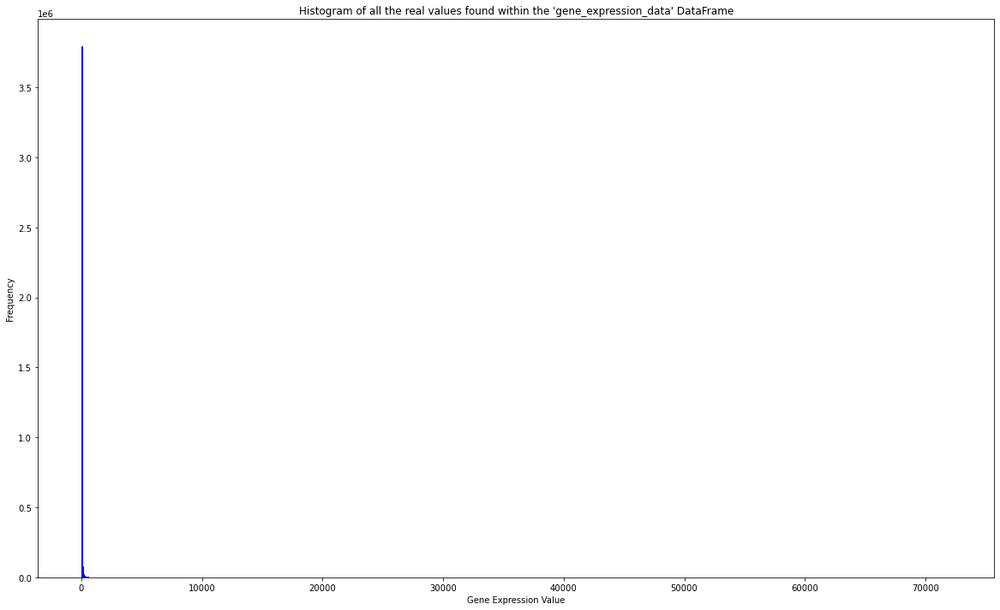

In [14]:
plt.figure(figsize=(20, 12))

# flattening the 'gene_expression_data' DataFrame into a 1D array.
gene_expression_data_values = np.ravel(gene_expression_data.iloc[:, 2:].values)

# plotting the histogram of all values.
plt.hist(gene_expression_data_values, bins=1000, edgecolor='blue')
plt.title('Histogram of all the real values found within the \'gene_expression_data\' DataFrame')
plt.xlabel('Gene Expression Value')
plt.ylabel('Frequency')
plt.show()

As we can see from the histogram above, there are a lot of values close to 0 present since the other bins are not even present on this histogram plot.

To get a better overview we can also limit the histogram such that only values between 0 and 1 are displayed.

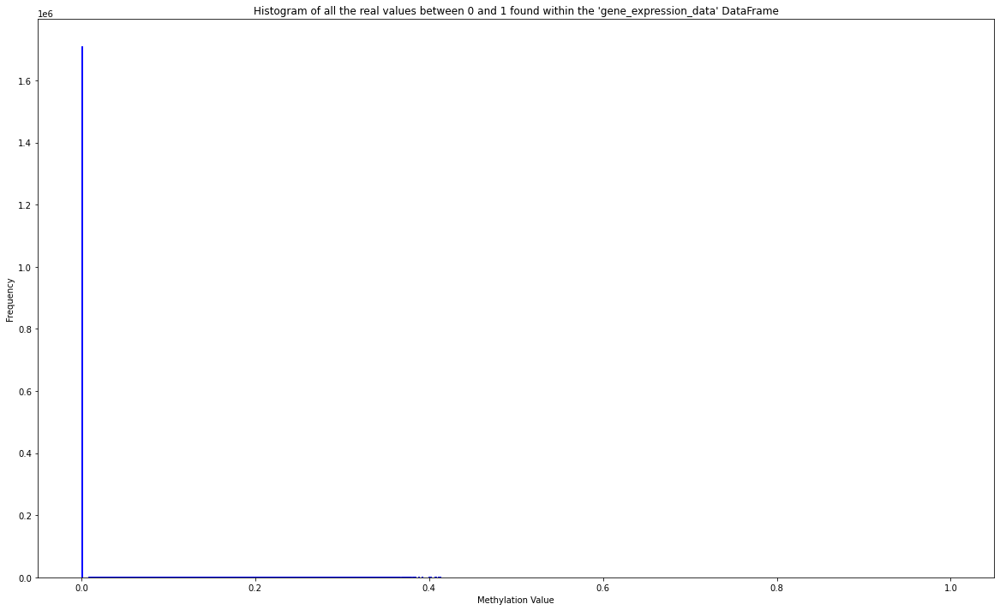

In [15]:
plt.figure(figsize=(20, 12))

# plotting the histogram of all values.
plt.hist(gene_expression_data_values, bins=1000, range=(0,1), edgecolor='blue')
plt.title('Histogram of all the real values between 0 and 1 found within the \'gene_expression_data\' DataFrame')
plt.xlabel('Methylation Value')
plt.ylabel('Frequency')
plt.show()

As we can see from the histogram above, there are quite a lot of values that are equal to 0. To get a better idea of how many out of the 3,942,900 values are equal to 0, we can use the function 'np.count_nonzero()' on the list 'gene_expression_data_values'.

In [16]:
# Counting how many zeros are present in the list 'gene_expression_data_values'.
num_zeros = num_real_values - np.count_nonzero(gene_expression_data_values)
print("The number of 0's present within the 'gene_expression_data' DataFrame: " + str(num_zeros))
print("Which is " + str((num_zeros/num_real_values)*100) + " percent of the total number of real values in the DataFrame")

NameError: name 'num_real_values' is not defined

In [ ]:
# Computing which genes have at least a single 0 present within their gene expression values by calling the function 'all()'
# on all of the rows, which each represent a unique gene.
zeros_genes = gene_expression_data.loc[(gene_expression_data.iloc[:, 2:]==0.0).any(axis=1)]
print("The number of genes for which at least 1 of the gene expression values is equal to 0: " + str(len(zeros_genes)))
print("Which is " + str((len(zeros_genes)/len(gene_expression_data))*100) + " percent of the total number of genes in the DataFrame")

Seeing as quite a lot of values that are equal to 0 exist as they make up roughly 43.4 percent of the total number of real values in the 'gene_expression_data' DataFrame and roughly 67.1 percent of the genes have at least a single 0 present in their row, we can first identify for which genes all the gene expression values are equal to 0. This can be achieved by calling the function 'all()' on all of the rows, which each represent a unique gene.

In [17]:
# Identifying for which genes all the gene expression values are equal to 0.
all_zeros_genes = gene_expression_data.loc[(gene_expression_data.iloc[:, 2:]==0.0).all(axis=1)]
print("All the genes for which all the gene expression values are equal to 0:")
all_zeros_genes

All the genes for which all the gene expression values are equal to 0:


,Gene ID,Gene Name,TCGA-06-0221-02A-11,TCGA-76-4928-01B-01,TCGA-26-5132-01A-01,TCGA-28-5218-01A-01,TCGA-06-0210-01A-01,TCGA-32-5222-01A-01,TCGA-06-5859-01A-01,TCGA-06-5413-01A-01,...,TCGA-32-1980-01A-01,TCGA-19-1389-02A-21,TCGA-19-5960-01A-11,TCGA-06-5418-01A-01,TCGA-06-1804-01A-01,TCGA-15-1444-01A-02,TCGA-06-0152-02A-01,TCGA-06-5415-01A-01,TCGA-19-0957-02A-11,TCGA-76-4929-01A-01
28,ENSG00000002586.20_PAR_Y,CD99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
283,ENSG00000011052.21,NME1-NME2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2193,ENSG00000100101.15,Z83844.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2592,ENSG00000101898.6,MCTS2P,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2820,ENSG00000103426.12,CORO7-PAM16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60647,ENSG00000288649.1,ACTL10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60648,ENSG00000288654.1,AC119733.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60654,ENSG00000288661.1,AL451106.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60657,ENSG00000288665.1,AC136977.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


As we can see from the output above, there are 6660 genes for which all the gene expression values are equal to 0. Since these genes do not contain any information, we can discard them from our dataset which will improve the efficiency later on when applying the machine learning techniques. This can be achieved by calling the function 'drop()' on the 'gene_expression_data' DataFrame.

In [18]:
gene_expression_zero_genes_removed = gene_expression_data.drop(all_zeros_genes.index)
print("The gene expression data after all the genes for which all the gene expression values are equal to 0 have been discarded:")
gene_expression_zero_genes_removed

The gene expression data after all the genes for which all the gene expression values are equal to 0 have been discarded:


,Gene ID,Gene Name,TCGA-06-0221-02A-11,TCGA-76-4928-01B-01,TCGA-26-5132-01A-01,TCGA-28-5218-01A-01,TCGA-06-0210-01A-01,TCGA-32-5222-01A-01,TCGA-06-5859-01A-01,TCGA-06-5413-01A-01,...,TCGA-32-1980-01A-01,TCGA-19-1389-02A-21,TCGA-19-5960-01A-11,TCGA-06-5418-01A-01,TCGA-06-1804-01A-01,TCGA-15-1444-01A-02,TCGA-06-0152-02A-01,TCGA-06-5415-01A-01,TCGA-19-0957-02A-11,TCGA-76-4929-01A-01
4,ENSG00000000003.15,TSPAN6,34.3045,66.0662,71.9519,76.9722,81.7969,105.1259,106.8657,146.2413,...,24.3036,56.1192,110.8961,84.0034,51.8153,79.3015,50.9843,95.7581,34.2730,117.6090
5,ENSG00000000005.6,TNMD,0.1278,0.2063,1.1969,212.6327,0.1334,0.3746,6.5304,2.0149,...,0.4089,0.0000,1.1017,0.8864,0.3312,0.6253,0.1591,0.8233,0.2051,5.6656
6,ENSG00000000419.13,DPM1,65.3189,89.2847,84.2576,85.4885,80.0162,143.1418,96.0231,132.6740,...,74.3346,75.4281,108.3149,105.1454,65.9500,61.3413,98.1366,117.6062,46.9677,90.8538
7,ENSG00000000457.14,SCYL3,7.6179,4.2106,6.3164,8.0810,4.8043,7.0083,10.8756,7.6998,...,5.0076,3.8505,9.8632,4.8304,5.1332,5.4407,6.3809,7.4290,4.9373,7.6404
8,ENSG00000000460.17,C1orf112,6.8873,3.8754,5.5325,4.7098,2.8904,7.2234,6.0676,7.6639,...,3.2461,2.5348,8.0895,3.8546,3.2281,5.1131,5.7963,5.2377,2.9793,2.3827
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60658,ENSG00000288667.1,AC078856.1,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,1.3410,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.2408,0.0000
60659,ENSG00000288669.1,AC008763.4,0.0000,0.0305,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0168,0.0000,0.0000,0.0193,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
60660,ENSG00000288670.1,AL592295.6,19.4144,6.9073,7.2689,13.3304,7.5160,9.1788,17.0350,6.3300,...,11.1699,9.1893,22.6318,9.5830,10.3947,16.3091,12.0011,13.0884,15.5815,9.9713
60662,ENSG00000288674.1,AL391628.1,0.0196,0.0190,0.0399,0.0546,0.0409,0.0216,0.0323,0.0396,...,0.0349,0.0340,0.0423,0.0400,0.0581,0.0411,0.0407,0.0292,0.0472,0.0269


We have noticed, however, that there were a lot of more genes present that featured at least a single 0 within their gene expression values. Since not a lot of information can be retrieved from a gene for which all of the gene expression values are low (close to 0), we can also find these and discard them from the gene expression data. This might be done by looking at which genes have a variance below a certain threshold. The difficulty with this approach, however, is that we do not want to remove genes which have high expression values but low variance as these are quite valuable for the machine learning algorithms applied later on. To check whether this problem would occur for our dataset, we can plot the variance versus the mean gene expression of all the genes in a scatter plot where one point represents a single gene. Mind that since there will be 54000 genes plotted, the scatter plot is not meant for identifying individual genes but rather seeing how the gene expression level relates to the variance.

In [19]:
# Copying the 'gene_expression_zero_genes_removed' such that we do not alter the original DataFrame.
gene_expression_zero_genes_removed_copy = gene_expression_zero_genes_removed.copy()

# Calculating the variance and mean expression for each of the genes.
gene_expression_zero_genes_removed_copy['Variance'] = gene_expression_zero_genes_removed_copy.iloc[:, 2:66].var(axis=1)
gene_expression_zero_genes_removed_copy['Mean'] = gene_expression_zero_genes_removed_copy.iloc[:, 2:66].mean(axis=1)

print("The variance and mean expression for each of the genes:")
gene_expression_zero_genes_removed_copy[['Gene ID', 'Gene Name', 'Variance', 'Mean']]

The variance and mean expression for each of the genes:


,Gene ID,Gene Name,Variance,Mean
4,ENSG00000000003.15,TSPAN6,955.115153,74.864423
5,ENSG00000000005.6,TNMD,702.687105,4.215589
6,ENSG00000000419.13,DPM1,875.120221,91.779181
7,ENSG00000000457.14,SCYL3,3.391041,6.134302
8,ENSG00000000460.17,C1orf112,3.120493,4.889020
...,...,...,...,...
60658,ENSG00000288667.1,AC078856.1,2.534086,0.387225
60659,ENSG00000288669.1,AC008763.4,0.000098,0.002805
60660,ENSG00000288670.1,AL592295.6,30.822208,11.690452
60662,ENSG00000288674.1,AL391628.1,0.000437,0.038073


In [20]:
# Creating a scatter plot of the variance and mean expression data by the 'px.scatter()' function.
fig = px.scatter(x=gene_expression_zero_genes_removed_copy['Mean'], y=gene_expression_zero_genes_removed_copy['Variance'])

fig.update_layout(
    title={'text': 'The variance of the genes plotted against the mean expression of the genes', 'x':0.5},
    xaxis_title='Mean Expression',
    yaxis_title='Variance'
)
fig.show()

As we can see for very large mean expression values (greater than 5k) the variance increases as the mean expression value increases. We cannot really verify this for the cluster of data points in the bottom left of the plot, but we can plot this area below.

In [21]:
# Creating a scatter plot of the variance and mean expression data by the 'px.scatter()' function.
fig = px.scatter(x=gene_expression_zero_genes_removed_copy['Mean'], y=gene_expression_zero_genes_removed_copy['Variance'])

fig.update_layout(
    title={'text': 'The variance of the genes plotted against the mean expression of the genes', 'x':0.5},
    xaxis_title='Mean Expression',
    yaxis_title='Variance')
fig.update_xaxes(range=[0, 1000])
fig.update_yaxes(range=[0, 5000])

fig.show()

The plot above also shows (now for smaller mean expression values as well) that as the mean expression increases, the variance also increases. This means that we can apply our approach of removing genes which have a variance below a certain threshold which will remove genes that are never really expressed (have low gene expression levels) without being afraid that genes with high gene expression levels would be removed as well. To actually remove the genes, we can use boolean indexing on the 'gene_expression_zero_genes_removed' DataFrame to select only rows that have a variance higher than the threshold.

In [22]:
# Setting the variance threshold.
variance_threshold = 1

# Using boolean indexing to select only the genes that have a variance higher than the threshold.
gene_expression_low_genes_removed = gene_expression_zero_genes_removed[gene_expression_zero_genes_removed_copy['Variance'] >= variance_threshold]
print("The gene expression data after all the genes for which their variance is smaller than the variance threshold of 1 have been removed:")
gene_expression_low_genes_removed

The gene expression data after all the genes for which their variance is smaller than the variance threshold of 1 have been removed:


,Gene ID,Gene Name,TCGA-06-0221-02A-11,TCGA-76-4928-01B-01,TCGA-26-5132-01A-01,TCGA-28-5218-01A-01,TCGA-06-0210-01A-01,TCGA-32-5222-01A-01,TCGA-06-5859-01A-01,TCGA-06-5413-01A-01,...,TCGA-32-1980-01A-01,TCGA-19-1389-02A-21,TCGA-19-5960-01A-11,TCGA-06-5418-01A-01,TCGA-06-1804-01A-01,TCGA-15-1444-01A-02,TCGA-06-0152-02A-01,TCGA-06-5415-01A-01,TCGA-19-0957-02A-11,TCGA-76-4929-01A-01
4,ENSG00000000003.15,TSPAN6,34.3045,66.0662,71.9519,76.9722,81.7969,105.1259,106.8657,146.2413,...,24.3036,56.1192,110.8961,84.0034,51.8153,79.3015,50.9843,95.7581,34.2730,117.6090
5,ENSG00000000005.6,TNMD,0.1278,0.2063,1.1969,212.6327,0.1334,0.3746,6.5304,2.0149,...,0.4089,0.0000,1.1017,0.8864,0.3312,0.6253,0.1591,0.8233,0.2051,5.6656
6,ENSG00000000419.13,DPM1,65.3189,89.2847,84.2576,85.4885,80.0162,143.1418,96.0231,132.6740,...,74.3346,75.4281,108.3149,105.1454,65.9500,61.3413,98.1366,117.6062,46.9677,90.8538
7,ENSG00000000457.14,SCYL3,7.6179,4.2106,6.3164,8.0810,4.8043,7.0083,10.8756,7.6998,...,5.0076,3.8505,9.8632,4.8304,5.1332,5.4407,6.3809,7.4290,4.9373,7.6404
8,ENSG00000000460.17,C1orf112,6.8873,3.8754,5.5325,4.7098,2.8904,7.2234,6.0676,7.6639,...,3.2461,2.5348,8.0895,3.8546,3.2281,5.1131,5.7963,5.2377,2.9793,2.3827
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60621,ENSG00000288617.1,AL049777.1,6.8471,2.7489,7.7796,0.2672,8.4065,5.0177,8.4420,7.7698,...,1.1456,0.7985,4.8613,7.1844,12.4826,3.1376,10.8429,9.5819,2.2628,0.2630
60651,ENSG00000288658.1,AC010980.1,2.7653,0.4309,0.6472,1.3285,0.1769,0.3028,2.2793,1.1823,...,3.0511,1.1028,2.6306,0.1297,1.0120,0.4889,2.2429,1.3863,1.0459,3.6902
60658,ENSG00000288667.1,AC078856.1,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,1.3410,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.2408,0.0000
60660,ENSG00000288670.1,AL592295.6,19.4144,6.9073,7.2689,13.3304,7.5160,9.1788,17.0350,6.3300,...,11.1699,9.1893,22.6318,9.5830,10.3947,16.3091,12.0011,13.0884,15.5815,9.9713


#### Detecting whether any samples are outliers

Next, we can detect whether any of the samples present in the 'gene_expression_low_genes_removed' DataFrame could be classified as outliers and potentially need to be removed. As we already saw in the section 'Further Processing Methylation File', this can be achieved by performing a Principal Component Analysis (PCA). PCA is a statistical method used to reduce the dimensionality of a dataset while retaining as much of the original variation as possible. In the context of outlier detection, PCA can be used to identify samples that are far away from the main cluster of samples in the dataset and thus can potentially be removed from the dataset. The PCA algorithm works by finding the directions called the principal components in the data that explain the most variation forming a new coordinate system that describes the data in terms of these directions. The first principal component is then the direction that explains the most variation in the data, the second principal component is the direction that explains the most variation after having considered for the first principal component, and so on. 

In the code block below, PCA is applied to the 'gene_expression_low_genes_removed' DataFrame. To achieve this, the PCA library from sklearn.decomposition can be used which is imported in the beginning of this notebook. The procedure can be divided into the following 3 steps:
1. Standardizing the data such that each column has zero mean and unit variance by subtracting the mean and dividing by the standard deviation to ensure that all the variables have the same scale and variance. This standardization is performed as a statistical method like PCA is sensitive to the scale of the variables.
2. To describe how each variable is related to every other variable, PCA computes the covariance matrix of the standardized data. The eigenvalues and eigenvectors of the covariance matrix are then computed where the eigenvectors represent the principal components and the corresponding eigenvalues the amount of variation explained by each principal component. This can be achieved by calling the function 'fit' on the PCA model.
3. We can visualize the data in a lower-dimensional space by projecting the data onto the first few principal components allowing us to detect patterns and relationships in the data. To achieve this, the function 'transform' can be called which computes the scores which are then plotted to represent this lower-dimensional space. Visually, a sample that is far away from the main cluster of samples in the plot could potentially be considered to be an outlier.

In [ ]:
# Transposing the data such that the samples appear as rows and not as columns as this is what the PCA library assumes.
gene_expression_data_T = gene_expression_low_genes_removed.T.iloc[2:,:]

# Step 1: Standardizing the data such that each column has zero mean and unit variance by subtracting the mean and dividing 
# by the standard deviation to ensure that all the variables have the same scale and variance.
gene_expression_data_standardized = (gene_expression_data_T - gene_expression_data_T.mean()) / gene_expression_data_T.std()
print('The standardized gene expression data:')
gene_expression_data_standardized

In [ ]:
# Step 2: To describe how each variable is related to every other variable, PCA computes the principal components of the 
# standardized data. This can be achieved by calling the function 'fit' on the PCA model.
pca = PCA()
pca.fit(gene_expression_data_standardized)

In [ ]:
# Step 3: visualizing the data in a lower-dimensional space by projecting the data onto the first few principal components 
# allowing us to detect patterns and relationships in the data. To achieve this, the function 'transform' can be called 
# which computes the scores which are then plotted to represent this lower-dimensional space.
scores = pca.transform(gene_expression_data_standardized)

indices = gene_expression_data_standardized.index
labels = []
for i in range(len(indices)):
    if indices[i] == "TCGA-06-AABW-11A-31" or indices[i] == "TCGA-06-0221-02A-11" or indices[i] == "TCGA-19-5960-01A-11":
        labels.append(indices[i])
    else:
        labels.append("")
        
    
fig = px.scatter(x=scores[:, 0], y=scores[:, 1], text=labels, labels={"x": "PC1", "y": "PC2"})
fig.update_layout(title={'text': 'PCA scores plot of the gene expression data', 'x':0.5},
                  xaxis_title='PC1',
                  yaxis_title='PC2')
fig.update_traces(textposition='bottom left')
fig.show()

Each point in the scores plot above represents a sample, and the position of the point is determined by the values of the first two principal components. Samples, data points, that are close together in the plot have similar principal component scores and therefore similar methylation profiles. Conversely, samples that are far apart have different methylation profiles. Samples that are located in different regions of the plot may represent different subpopulations or groups within the dataset. Outliers in the PCA scores plot may represent samples that have unusual methylation profiles compared to the rest of the dataset. These outliers may be due to technical or biological factors that need to be identified and addressed. Within the scores plot above, I already denoted some potential outliers with their sample names such that it is easier to refer to them in the paragraph below.

As we can see from the scores plot above, there are three data points that seem to be a little further away from the main cluster of data points. These three data points are denoted by their sample names in the scores plot above. These samples have the names 'TCGA-06-AABW-11A-31', 'TCGA-06-0221-02A-11, and 'TCGA-19-5960-01A-11'. They are located just a little distance away from the main cluster and since we want to keep as many samples as possible and from the kernel density estimates plots above these did not really stand out, we will not remove these. Since none of the samples will be removed, meaning also that we do not have to go back to remove the samples in the methylation data as well (since the samples of the methylation data and the gene expression data need to match), the DataFrame 'gene_expression_low_genes_removed' represents the cleaned gene expression data.

In [23]:
# Reassigning the 'gene_expression_low_genes_removed' DataFrame to the 'gene_expression_data_cleaned' DataFrame to denote
# that the gene expression data has been fully cleaned.
gene_expression_data_cleaned = gene_expression_low_genes_removed

As we have already plotted the histogram of all the values present within the 'gene_expression_data_cleaned' DataFrame, we can also plot the distributions of gene expression values for each of the samples independently but within the same plot to further investigate the distributions. To achieve this, the function 'sns.kdeplot()' can be called for every sample (patient) which plots a Kernel Density Estimate of the values present in its column. Now this will create a lot of different kernel density estimates (64 in total) within the same plot, so this plot is not really meant for detecting which distribution corresponds to which sample but rather whether a distribution appears that does not look similar to the other ones.

In [ ]:
plt.figure(figsize=(20, 12))

# For every column (except for the column featuring the names of the genes) in the 'gene_expression_data_cleaned' 
# DataFrame, the kernel density estimate of the values is plotted.
for col in gene_expression_data_cleaned.columns:
    if col != 'Gene ID' and col != 'Gene Name':
        sns.kdeplot(data=gene_expression_data_cleaned, x=col, label=col)

# Adding the legend, a title and the labels to the plot.
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=7)
plt.title("The Distributions of the Samples")
plt.xlabel("Gene Expression Value")
plt.ylabel("Density")

# Showing the plot.
plt.show()

As we can see from the plot above, the distributions seems to be quite similar to each other and there are still a lot of zeroes present in each of these distributions. To make the data slighlty more normally distributed, we could apply a log2-transformation which converts each expression value to the log base 2 of the value. This can be achieved by calling the function 'np.log2()'. One reason why this log2-transformation is applied is that the resulting (more) normally distributed data follows the assumptions of most statistical tests. Another reason is that it can make differences between data points easier to interpret, especially when the data has a wide range of values. Both the non-transformed and the transformed data will be stored in separate files in the section 'Storing the Resulting Cleaned Methylation and Gene Expression data' such that both can be used when applying the machine learning algorithms later on. The first step of transforming this data is by first adding a 1 to every value. The reason for this is that we have quite a lot of zeros in the 'gene_expression_data_cleaned' DataFrame which when log2-transformed map to -inf. Since this '-inf' is not really interpretable for our machine learning algorithms applied later on, we add this 1 to every value causing the minimum value in the DataFrame to be equal to 1 as well. This will also result in all log2-transformed values being positive since log2-transforming numbers that are equal to or larger than 1 results in positive numbers as well.

In [ ]:
# Copying the 'gene_expression_data_cleaned' DataFrame such that is not altered.
gene_expression_data_copy = gene_expression_data_cleaned.copy()

# Adding a 1 to every value in the 'gene_expression_data_copy' DataFrame.
gene_expression_data_copy = gene_expression_data_copy.iloc[:, 2:] + 1

# Applying log2-transformation by calling the function 'np.log2()'.
gene_expression_data_log2_transformed = np.log2(gene_expression_data_copy)

print("The log2-transformed cleaned gene expression data:")
gene_expression_data_log2_transformed

We can also plot the transformed distributions of gene expression values for each of the samples independently but within the same plot to further investigate the distributions. To achieve this, the function 'sns.kdeplot()' can be called for every sample (patient) which plots a Kernel Density Estimate of the values present in its column. Now this will create a lot of different kernel density estimates (64 in total) within the same plot, so this plot is not really meant for detecting which distribution corresponds to which sample but rather whether a distribution appears that does not look similar to the other ones.

In [ ]:
plt.figure(figsize=(20, 12))

# For every column (except for the column featuring the names of the genes) in the 'gene_expression_data_log2_transformed' 
# DataFrame, the kernel density estimate of the values is plotted.
for col in gene_expression_data_log2_transformed.columns:
    sns.kdeplot(data=gene_expression_data_log2_transformed, x=col, label=col)

# Adding the legend, a title and the labels to the plot.
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=7)
plt.title("The Distributions of the Samples")
plt.xlabel("Gene Expression Value")
plt.ylabel("Density")

# Showing the plot.
plt.show()

As we can see from the plot above, all of the distributions now look somewhat normally distributed as there is a clear single mode but the distributions are slighlty more skewed to the right.

Next, we can include the columns featuring the IDs and names of the genes in the 'gene_expression_data_log2_transformed' DataFrame by calling the function 'pd.concat()'.

In [ ]:
# Inserting the column featuring the IDs and names of the genes into the 'gene_expression_data_log2_transformed'
gene_expression_data_log2_cleaned_transformed = pd.concat([gene_expression_data_cleaned[['Gene ID', 'Gene Name']], gene_expression_data_log2_transformed], axis=1)

print("The log2-transformed cleaned gene expression data:")
gene_expression_data_log2_cleaned_transformed

To verify that no missing values have been added throughout the process above, we can call the function 'isna()' again.

In [ ]:
# Checking whether all the genes in the 'gene_expression_data_log2_cleaned_transformed' DataFrame do indeed not contain any 
# missing values. This can be achieved by calling the function 'isna()' followed by calling the function 'any()' twice. The 
# reason for having a double 'any()' call in the code is to check if there are any True values in the boolean DataFrame that 
# is returned by the 'isna()' function.
if not gene_expression_data_log2_cleaned_transformed.isna().any().any():
    print("Every value in the 'gene_expression_data_log2_cleaned_transformed' DataFrame is not NaN.")
else:
    print("There are NaN values in the 'gene_expression_data_log2_cleaned_transformed' DataFrame.")

## Checking Whether Further Normalization is Needed

Next, we can check whether we would still need to apply some form of normalization to the datasets. As already mentioned in the 'Introduction' the gene expression values are measured in Transcripts Per Million (TPM) units where TPM is a normalization method of the amount of RNA transcripts for a particular gene in a sample. This means that the data has already been normalized at some point but we could still check whether we could apply another form of normalization after the data has been processed by plotting a box and whisker plot for each of the samples their distribution within the same plot and see whether the boxes align. This can be done for both the 'gene_expression_data_cleaned' and the 'gene_expression_data_log2_cleaned_transformed' DataFrames.

##### 'gene_expression_data_cleaned' DataFrame Boxplots

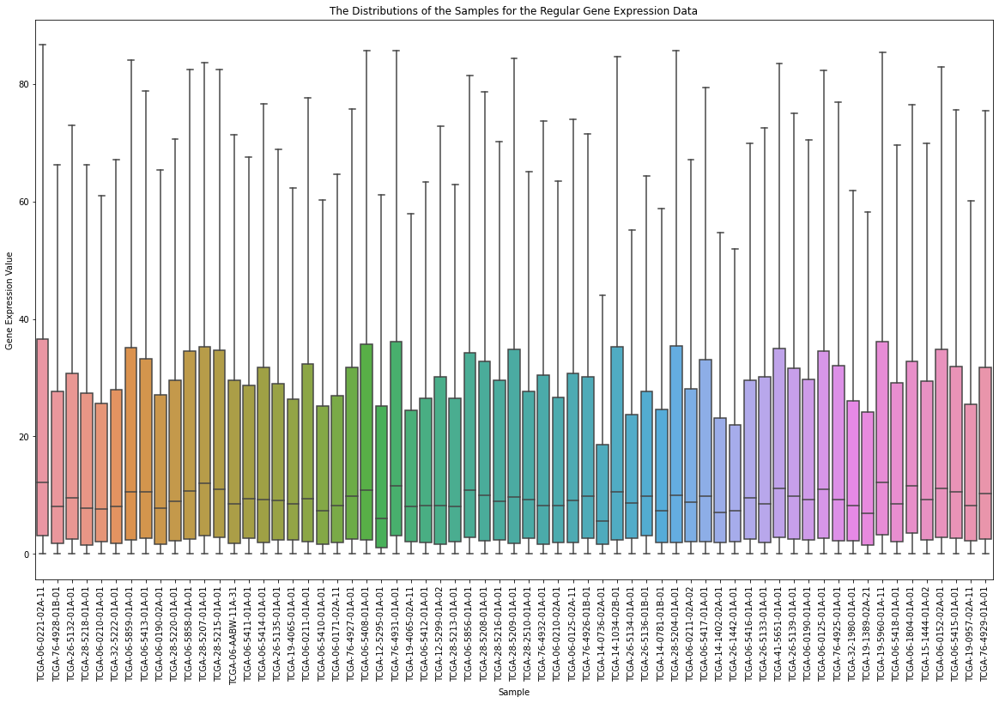

In [24]:
plt.figure(figsize=(20, 12))

# Creating a boxplot for every column (except for the columns featuring the IDs and names of the genes) in the 
# 'gene_expression_data_cleaned' DataFrame, plotting them on the same axis, without showing the outliers.
ax = sns.boxplot(data=gene_expression_data_cleaned.drop(columns=['Gene ID', 'Gene Name']), showfliers=False)
ax.set_xticklabels(ax.get_xticklabels(), rotation='vertical')

# Adding the legend, a title and the labels to the plot.
plt.title("The Distributions of the Samples for the 'gene_expression_data_cleaned' DataFrame")
plt.xlabel("Sample")
plt.ylabel("Gene Expression Value")

# Show the plot
plt.show()

##### 'gene_expression_data_log2_cleaned_transformed' DataFrame Boxplots

In [ ]:
plt.figure(figsize=(20, 12))

# Creating a boxplot for every column (except for the columns featuring the IDs and names of the genes) in the 
# 'gene_expression_data_log2_cleaned_transformed' DataFrame, plotting them on the same axis, without showing the outliers.
ax = sns.boxplot(data=gene_expression_data_log2_cleaned_transformed.drop(columns=['Gene ID', 'Gene Name']), showfliers=False)
ax.set_xticklabels(ax.get_xticklabels(), rotation='vertical')

# Adding the legend, a title and the labels to the plot.
plt.title("The Distributions of the Samples for the 'gene_expression_data_cleaned' DataFrame")
plt.xlabel("Sample")
plt.ylabel("Gene Expression Value")

# Show the plot
plt.show()

As we can see from the boxplots above, the boxplots somewhat align but normalizing them would assure that the boxplots for all the samples would have the same size. Therefore, normalization is an option here. One form of normalization that we could apply is quantile normalization. Quantile normalization aligns the distribution of the gene expression values between different samples by matching their quantiles [2]. One problem, however, is that we cannot apply this form of normalization at this point as quantile normalization is not a within-sample normalization method. This means that if we were to perform this quantile normalization before the training and test splits, the information from the test set could potentially influence the normalization process, compromising the independence of the test set [2]. This information leakage would result in an overestimation of the model's performance when evaluated on the test set. Therefore, it is crucial to normalize the gene expression data separately within the training set and the test set. This will be performed in the notebook 'Gene Expression Data Quantile Normalization.ipynb' present in the directory 'Machine Learning Algorithms'. 

## Storing the Resulting Cleaned Gene Expression data

#### Storing the resulting 'gene_expression_data_cleaned' DataFrame

Now that we have completed cleaning our original 'gene_expression_data' DataFrame, we can store its result (the 'gene_expression_data_cleaned' DataFrame) to the local directory 'data_directory_combined_cleaned_files'.

In [ ]:
# Defining where to save the resulting file and its name.
file_to_save = data_directory_combined_cleaned_files + "/gene_expression_data_cleaned.csv"

# Saving the file.
if not os.path.exists(file_to_save):
    gene_expression_data_cleaned.to_csv(file_to_save, index=False)
    print("The file with the path " + file_to_save + " has been created.")
else:
    print("The file with the path " + file_to_save + " already exists.")

#### Storing the resulting 'gene_expression_data_log2_cleaned_transformed' DataFrame

Now that we have completed cleaning our original 'gene_expression_data' DataFrame and log2-transformed it, we can store its result (the 'gene_expression_data_log2_cleaned_transformed' DataFrame) to the local directory 'data_directory_combined_cleaned_files'.

In [ ]:
# Defining where to save the resulting file and its name.
file_to_save = data_directory_combined_cleaned_files + "/gene_expression_data_cleaned_log2_transformed.csv"

# Saving the file.
if not os.path.exists(file_to_save):
    gene_expression_data_log2_cleaned_transformed.to_csv(file_to_save, index=False)
    print("The file with the path " + file_to_save + " has been created.")
else:
    print("The file with the path " + file_to_save + " already exists.")